# Numerical Differentiation

We begin by considering a fundamental question: why approximate derivatives numerically when analytical differentiation is well-established? The answer reveals itself through several practical considerations. 

1. We often encounter functions known only through discrete measurements rather than closed-form expressions, making analytical differentiation impossible. 
2. Even when exact formulas exist, evaluating them may require extensive function evaluations that become computationally prohibitive. In such cases, a well-chosen numerical approximation can provide the needed derivative at significantly lower cost. 
3. When solving differential equations numerically, we represent solutions on discrete grids where derivatives must be approximated using only neighboring grid values, since the underlying solution itself remains unknown during the computation.


![](graphics/FiniteDifference.png){width=60% fig-align="center"}


We recall the fundamental definition of the derivative as a limit. Consider a function $f(x)$ and a point $x$ at which we seek the derivative. The difference quotient $\frac{f(x+h) - f(x)}{h}$ gives the slope of the secant line connecting $(x, f(x))$ to $(x+h, f(x+h))$. As the spacing $h$ approaches zero, this secant line rotates toward the tangent line, and the difference quotient approaches the true derivative $f'(x)$. This geometric interpretation suggests a natural numerical strategy: evaluate the difference quotient for small but finite $h$ to approximate the derivative. The figure below illustrates this process, showing how the secant line (in blue) approaches the tangent line (in red) as $h$ decreases.

## Visualizing Forward Difference Approximation

We now demonstrate the forward difference approximation through a concrete example. Consider the function $f(x) = -x^2$ and suppose we wish to approximate its derivative at $x_1 = 1$. The true derivative is $f'(x) = -2x$, giving $f'(1) = -2$. The forward difference approximation uses the formula


$$
\begin{aligned}
& f^{\prime}(x)=\lim _{\Delta x \rightarrow 0} \frac{\Delta y}{\Delta x}=\lim _{h \rightarrow 0} \frac{f(x+h)-f(x)}{h} \\
& k_T=\tan (\theta)=f^{\prime}(x)
\end{aligned}
$$

where $h > 0$ is the step size. As $h$ decreases from 1 to 0.1, we observe the secant line converging toward the tangent line, $k_T$ with angle $\theta$, and the numerical approximation improving toward the exact derivative value of $-2$.

In [1]:
#| code-fold: true
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the function and its derivative
def f(x):
    return -x**2

def df(x):
    return -2*x

# Parameters
x1 = 1.0
f_x1 = f(x1)
df_x1 = df(x1)  # True derivative at x1 = -2

# Create array of h values from 1 to 0.1
h_values = np.linspace(1.0, 0.1, 50)

x2 = x1 + h_values[-1]  # Just to define x2 for initialization

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(-0.5, 3)
ax.set_ylim(-5, 1)
ax.set_xlabel('$x$', fontsize=12)
ax.set_ylabel('$y$', fontsize=12)
ax.set_title('Forward Difference Approximation: $f(x) = -x^2$ at $x_1 = 1$', fontsize=14)
ax.grid(True, alpha=0.3)
ax.axhline(y=0, color='k', linewidth=0.5)
ax.axvline(x=0, color='k', linewidth=0.5)

# Plot the function curve
x_curve = np.linspace(-0.5, 3, 200)
y_curve = f(x_curve)
ax.plot(x_curve, y_curve, 'r-', linewidth=2, label='$f(x) = -x^2$')

# Plot the point of interest
point, = ax.plot(x1, f_x1, 'ko', markersize=8, label=f'Point $(x_1, f(x_1)) = ({x1}, {f_x1})$')

# Initialize plot elements that will be updated
tangent_line, = ax.plot([], [], 'r--', linewidth=2, label='True tangent (slope = -2)')
secant_line, = ax.plot([], [], 'b-', linewidth=2.5, label='Secant line')
second_point, = ax.plot([], [], 'bo', markersize=8)
first_line = ax.plot([], [], 'y-',linewidth=1)
second_line = ax.plot([], [], 'y-',linewidth=1)

# Text annotations
h_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=11, 
                 verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
approx_text = ax.text(0.5, 0.95, '', transform=ax.transAxes, fontsize=11,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

ax.legend(loc='lower left', fontsize=10)

# Initialization function
def init():
    tangent_line.set_data([], [])
    secant_line.set_data([], [])
    second_point.set_data([], [])
    h_text.set_text('')
    approx_text.set_text('')
    return tangent_line, secant_line, second_point, h_text, approx_text

# Animation function
def animate(i):
    h = h_values[i]
    
    # Calculate the second point for the secant
    x2 = x1 + h
    f_x2 = f(x2)
    
    # Calculate the approximate derivative (forward difference)
    f_prime_approx = (f_x2 - f_x1) / h
    
    # Plot the true tangent line (using true derivative)
    x_tangent = np.array([x1 - 0.5, x1 + 1.5])
    y_tangent = f_x1 + df_x1 * (x_tangent - x1)
    tangent_line.set_data(x_tangent, y_tangent)
    
    # Plot the secant line
    x_secant = np.array([x1, x2])
    y_secant = np.array([f_x1, f_x2])
    x_tangent_approx = np.array([x1 - 0.5, x1 + 1.5])
    y_tangent_approx = f_x1 + f_prime_approx * (x_tangent - x1)
    # secant_line.set_data(x_secant, y_secant)
    secant_line.set_data(x_tangent_approx, y_tangent_approx)
    
    first_line[0].set_data([x1, x1], [-10, f_x1])
    second_line[0].set_data([x2, x2], [-10, f_x2])
    
    # Plot the second point
    second_point.set_data([x2], [f_x2])
    
    # Update text
    h_text.set_text(f'Step size: $h = {h:.3f}$')
    approx_text.set_text(f"Approx. derivative: $f'(1) \\approx {f_prime_approx:.4f}$\nTrue derivative: $f'(1) = {df_x1:.4f}$\nError: ${abs(f_prime_approx - df_x1):.4f}$")
    
    return tangent_line, secant_line, second_point, h_text, approx_text

# Create animation
anim = FuncAnimation(fig, animate, init_func=init, frames=len(h_values), 
                    interval=100, blit=True, repeat=True)

# Display as HTML
plt.close()  # Prevent duplicate display

# Convert to responsive HTML
import mechanicskit as mk
mk.to_responsive_html(anim, container_id='forward-difference-animation')

## Analysis of the first derivative approximation

Thus, a simple approximation of the first derivative is


$$
f^{\prime}(x) \approx \frac{f(x+h)-f(x)}{h}
$$ {#eq-forward-difference}



where we assume that $h>0$. What do we mean when we say that the expression on the right-hand side of @eq-forward-difference is an approximation of the derivative? For linear functions that right-hand side is actually an exact expression for the derivative. But for almost all other functions, it is not the exact derivative.

Let's compute the approximation error. The Taylor expansion will be the main vehicle throughout this chapter. So, write a Taylor expansion of $f(x+h)$ about $x$, i.e.

$$
f(x+h)\overset{\text{Taylor}}{=}f(x)+h\frac{df}{dx}+\frac{h^{2}}{2!}\frac{d^{2}f}{dx^{2}}+\frac{h^{3}}{3!}\frac{d^{3}f}{dx^{3}}+\cdots
$$ {#eq-taylor-expansion}

For such an expansion to be valid, we need $f$ to be sufficiently smooth (i.e., $f(x)$ has at least two continuous derivatives). Re-arranging the Tayler expansion @eq-taylor-expansion lets us replace the approximation @eq-forward-difference with and exact expression of the form

$$
\frac{df}{dx}=\frac{f(x+h)-f(x)}{h}-\frac{h}{2!}\frac{d^{2}f}{dx^{2}}-\frac{h^{2}}{3!}\frac{d^{3}f}{dx^{3}}-\cdots
$$

If we truncate the series after the first term, we get back the approximation @eq-forward-difference. The truncation error is given by the remaining terms in the series. The leading term in the truncation error is $-\frac{h}{2!}\frac{d^{2}f}{dx^{2}}$, so the error in the approximation @eq-forward-difference is proportional to $h$. In other words, if we halve $h$, we expect the error to also halve and we say that the forward difference approximation @eq-forward-difference is *first-order accurate*. We express this formally using big O notation, writing the error as $\mathcal{O}(h)$, where $\mathcal{O}$ (read "order of") indicates that the error is proportionally to $h$ as $h \to 0$.

Since this approximation uses information only from the point $x$ and a point in front of $x$ (i.e., $x+h$), it is called a *forward difference* approximation. We could also use a point behind $x$, at $x-h$ to approximate the derivative. This leads to the *backward difference* approximation:

$$
\boxed{\frac{df}{dx} \approx \frac{f(x)-f(x-h)}{h}} =\dfrac{df}{dx} -\frac{h}{2!}\frac{d^{2}f}{dx^{2}}-\frac{h^{2}}{3!}\frac{d^{3}f}{dx^{3}}-\cdots
$${#eq-backward-difference}

It is clear that it has the same order of accuracy. We get this approximation from a similar Taylor expansion of $f(x-h)$ about $x$. 

$$
f(x-h)\overset{\text{Taylor}}{=}f(x)-h\dfrac{df}{dx}+\dfrac{h^{2}}{2!}\dfrac{d^{2}f}{dx^{2}}-\dfrac{h^{3}}{3!}\dfrac{d^{3}f}{dx^{3}}+\cdots 
$$ {#eq-taylor-expansion-backward}

It is possible to combine the Taylor expansions @eq-taylor-expansion and @eq-taylor-expansion-backward, resulting in a more accurate approximation of the first derivative. Subtracting @eq-taylor-expansion-backward from @eq-taylor-expansion gives

$$
f(x+h)-f(x-h)=2h\dfrac{df}{dx}+2\dfrac{h^{3}}{3!}\dfrac{d^{3}f}{dx^{3}}+\cdots+\mathcal{O}(h^{5})
$$ {#eq-central-difference-derivation}

Rearranging @eq-central-difference-derivation leads to the *central difference* approximation:

$$
\boxed{\frac{df}{dx} \approx \frac{f(x+h)-f(x-h)}{2h}} =\dfrac{df}{dx}+\dfrac{h^{2}}{3!}\dfrac{d^{3}f}{dx^{3}}+\cdots+\mathcal{O}(h^{5})
$$ {#eq-central-difference}

We see that the leading term in the truncation error is proportional to $h^{2}$. Thus, the central difference approximation is *second-order accurate*. This means that if we halve $h$, we expect the error to reduce by a factor of four.

![A comparison of the finite difference methods. Notice how the central method is more "parallel" to the true slope.](graphics/DifferencingMethods.png){width=100% fig-align="center"}

## Second Derivative Approximation

We now turn to approximating the second derivative. The second derivative is defined through the limit

$$
  \dfrac{d^{2}f}{dx^{2}}=\lim_{h\rightarrow0}\dfrac{f'(x+h)-f'(x)}{h}
  $$

which suggests a forward difference approximation

$$
\dfrac{d^2f}{dx^2}\approx\dfrac{f'(x+h)-f'(x)}{h}
$$

However, this formula requires evaluating the first derivative at two points, which is itself an approximation. We can derive a more practical formula that uses only function values by manipulating the Taylor expansions we established earlier.

Adding equations @eq-taylor-expansion and @eq-taylor-expansion-backward, we find that the odd-order derivative terms cancel while the even-order terms double:

$$
  f(x+h)+f(x-h)=2f(x)+2\dfrac{h^{2}}{2!}\dfrac{d^{2}f}{dx^{2}}+\mathcal{O}(h^{4})
$$

Rearranging this expression to isolate the second derivative yields the central difference approximation for the second derivative:

$$
  \boxed{\dfrac{d^{2}f}{dx^{2}}=\dfrac{f(x+h)-2f(x)+f(x-h)}{h^{2}}+\mathcal{O}(h^{2})}
  $$

This formula is particularly elegant: it evaluates the function at three equally spaced points and combines them through a symmetric stencil. The truncation error is $\mathcal{O}(h^{2})$, meaning this approximation is second-order accurate. If we halve the step size $h$, the error decreases by a factor of four, providing the same convergence rate as the central difference formula for the first derivative.

## Application Example: Analyzing Motion Data

We now apply the finite difference formulas to analyze real trajectory data. Consider a projectile motion where we have discrete measurements of position $(x(t), y(t))$ at different time instances. Our goal is to compute the velocity and acceleration from these position measurements, demonstrating how different finite difference schemes perform and revealing their sensitivity to measurement noise.

### Trajectory Data

We begin with position measurements of a projectile sampled at regular time intervals. The trajectory exhibits the characteristic parabolic shape of ballistic motion under gravity.

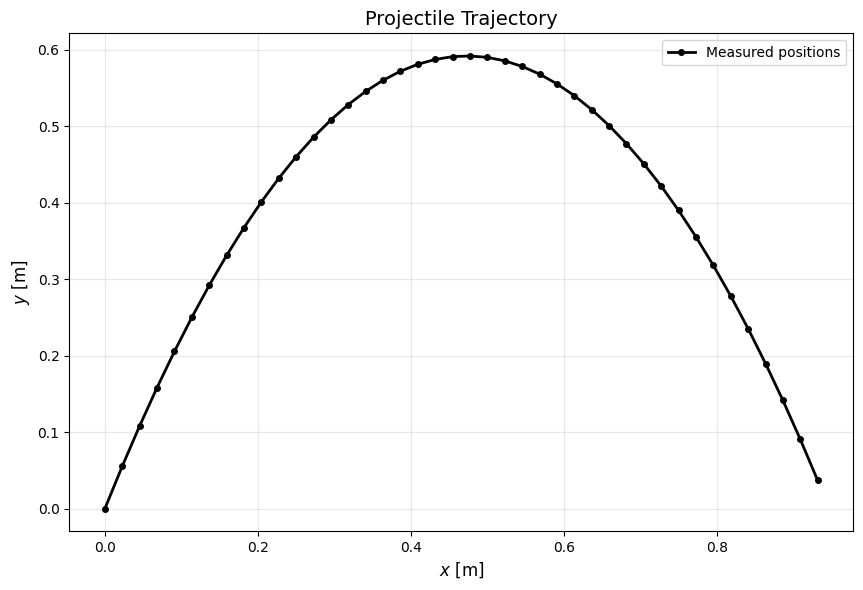

In [2]:
# | code-fold: true
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Trajectory data (projectile motion measurements)
tdata = np.array([0, 0.016666667, 0.033333333, 0.05, 0.066666667, 0.083333333, 0.1, 
                  0.116666667, 0.133333333, 0.15, 0.166666667, 0.183333333, 0.2, 
                  0.216666667, 0.233333333, 0.25, 0.266666667, 0.283333333, 0.3, 
                  0.316666667, 0.333333333, 0.35, 0.366666667, 0.383333333, 0.4, 
                  0.416666667, 0.433333333, 0.45, 0.466666667, 0.483333333, 0.5, 
                  0.516666667, 0.533333333, 0.55, 0.566666667, 0.583333333, 0.6, 
                  0.616666667, 0.633333333, 0.65, 0.666666667, 0.683333333])

xdata = np.array([0, 0.022727273, 0.045454545, 0.068181818, 0.090909091, 0.113636364,
                  0.136363636, 0.159090909, 0.181818182, 0.204545455, 0.227272727, 0.25,
                  0.272727273, 0.295454545, 0.318181818, 0.340909091, 0.363636364,
                  0.386363636, 0.409090909, 0.431818182, 0.454545455, 0.477272727, 0.5,
                  0.522727273, 0.545454545, 0.568181818, 0.590909091, 0.613636364,
                  0.636363636, 0.659090909, 0.681818182, 0.704545455, 0.727272727, 0.75,
                  0.772727273, 0.795454545, 0.818181818, 0.840909091, 0.863636364,
                  0.886363636, 0.909090909, 0.931818182])

ydata = np.array([0, 0.055454293, 0.108180808, 0.158179545, 0.205450505, 0.249993687,
                  0.291809091, 0.330896717, 0.367256566, 0.400888636, 0.431792929,
                  0.459969444, 0.485418182, 0.508139141, 0.528132323, 0.545397727,
                  0.559935354, 0.571745202, 0.580827273, 0.587181566, 0.590808081,
                  0.591706818, 0.589877778, 0.58532096, 0.578036364, 0.56802399,
                  0.555283838, 0.539815909, 0.521620202, 0.500696717, 0.477045455,
                  0.450666414, 0.421559596, 0.389725, 0.355162626, 0.317872475,
                  0.277854545, 0.235108838, 0.189635354, 0.141434091, 0.090505051,
                  0.036848232])

# Plot the trajectory
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(xdata, ydata, 'ko-', linewidth=2, markersize=4, label='Measured positions')
ax.set_xlabel('$x$ [m]', fontsize=12)
ax.set_ylabel('$y$ [m]', fontsize=12)
ax.set_title('Projectile Trajectory', fontsize=14)
ax.grid(True, alpha=0.3)
ax.set_aspect('equal', adjustable='box')
ax.legend()
plt.tight_layout()
plt.show()

### Computing Velocity: Comparing Finite Difference Schemes

The velocity is the first derivative of position with respect to time: $\mathbf{v} = \frac{d\mathbf{r}}{dt}$. We compute the $x$-component of velocity using three different finite difference approximations and compare their behavior.

The animation below shows how velocity vectors evolve along the trajectory. Notice that the forward and backward differences produce the same values but assign them to different time points, while the central difference provides a more symmetric approximation.

In [3]:
# | code-fold: true
# Create animation comparing velocity using different finite difference schemes

# Forward difference: v(t_i) ≈ [x(t_{i+1}) - x(t_i)] / h
dt_forward = np.diff(tdata)
vx_forward = np.diff(xdata) / dt_forward
vy_forward = np.diff(ydata) / dt_forward
t_forward = tdata[:-1]  # Velocity defined at earlier time points

# Backward difference: v(t_i) ≈ [x(t_i) - x(t_{i-1})] / h
dt_backward = np.diff(tdata)
vx_backward = np.diff(xdata) / dt_backward
vy_backward = np.diff(ydata) / dt_backward
t_backward = tdata[1:]  # Velocity defined at later time points

# Central difference: v(t_i) ≈ [x(t_{i+1}) - x(t_{i-1})] / (2h)
vx_central = (xdata[2:] - xdata[:-2]) / (tdata[2:] - tdata[:-2])
vy_central = (ydata[2:] - ydata[:-2]) / (tdata[2:] - tdata[:-2])
t_central = tdata[1:-1]  # Velocity defined at middle time points






def animate(frame_idx):
    ax.clear()
    
    # Left plot: Trajectory comparison
    ax.plot(xdata, ydata, 'k-o', linewidth=2, label='Trajectory')
    
    if frame_idx < len(dt_forward):
        idx = frame_idx
        # Current positions
        ax.plot(xdata[idx], ydata[idx], 'bo', markersize=10, zorder=5)
        
        # Velocity vectors (scaled for visibility)
        scale = 0.05
        ax.quiver(xdata[idx+1], ydata[idx+1], vx_forward[idx], vy_forward[idx],
                   color='blue', scale=1/scale, scale_units='xy', width=0.004, zorder=4,
                   label=f'Forward difference')
        
        ax.quiver(xdata[idx], ydata[idx], vx_backward[idx], vy_backward[idx],
                   color='cyan', scale=1/scale, scale_units='xy', width=0.004, zorder=4,
                   label=f'Backward difference')
        
        if frame_idx > 0 and frame_idx < len(vx_central):
            ax.quiver(xdata[idx], ydata[idx], vx_central[idx-1], vy_central[idx-1],
                       color='darkgreen', scale=1/scale, scale_units='xy', width=0.004, zorder=4,
                       label=f'Central difference')
    
    ax.set_xlabel('$x$ [m]', fontsize=12)
    ax.set_ylabel('$y$ [m]', fontsize=12)
    ax.set_title('Trajectory with Velocity Vectors', fontsize=14)
    ax.set_xlim(-0.05, 1.0)
    ax.set_ylim(-0.05, 0.65)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper right', fontsize=9)
    
    

# Create animation
plt.close(fig)
anim = FuncAnimation(fig, animate, frames=len(xdata)-1, interval=100, repeat=True)

# Convert to responsive HTML
import mechanicskit as mk
mk.to_responsive_html(anim, container_id='velocity-comparison-animation')

### Computing Acceleration: Second Derivative

The acceleration is the second derivative of position: $\mathbf{a} = \frac{d^2\mathbf{r}}{dt^2}$. We apply the central difference formula for the second derivative:

$$
\frac{d^2x}{dt^2} \approx \frac{x(t+h) - 2x(t) + x(t-h)}{h^2}
$$

This formula combines three consecutive position measurements to estimate acceleration at the middle time point.


In [4]:
# | code-fold: true
# Create animation showing both velocity and acceleration vectors
# Second derivative (acceleration) using central difference: a(t_i) ≈ [x(t_{i+1}) - 2x(t_i) + x(t_{i-1})] / h^2
h = tdata[1] - tdata[0]  # Assuming uniform time spacing

ax_accel = (xdata[2:] - 2*xdata[1:-1] + xdata[:-2]) / h**2
ay_accel = (ydata[2:] - 2*ydata[1:-1] + ydata[:-2]) / h**2
x_accel_pos = xdata[1:-1]
y_accel_pos = ydata[1:-1]
t_accel = tdata[1:-1]



fig, ax = plt.subplots(figsize=(10, 6))

def animate(frame_idx):
    ax.clear()
    
    # Plot trajectory
    ax.plot(xdata, ydata, 'k-', linewidth=1, label='Trajectory')
    ax.plot(xdata, ydata, 'ko', markersize=4)
    
    # Current position (for acceleration, which has fewer points)
    if frame_idx < len(x_accel_pos):
        idx = frame_idx
        
        ax.plot([xdata[idx],xdata[idx+2]], [ydata[idx],ydata[idx+2]], 'yo', markersize=4, 
                zorder=5)
        
        ax.plot(x_accel_pos[idx], y_accel_pos[idx], 'ro', markersize=10, 
                label=f't={t_accel[idx]:.3f}s', zorder=5)
        
        # Velocity vector
        scale_v = 0.05
        ax.quiver(x_accel_pos[idx], y_accel_pos[idx], 
                  vx_central[idx], vy_central[idx], 
                  color='blue', scale=1/scale_v, scale_units='xy', width=0.004, zorder=4,
                  label=f'First derivative using central Difference')
        
        # Acceleration vector
        scale_a = 0.01
        ax.quiver(x_accel_pos[idx], y_accel_pos[idx], 
                  ax_accel[idx], ay_accel[idx], 
                  color='red', scale=1/scale_a, scale_units='xy', width=0.004, zorder=4,
                  label=f'Second derivative using central Difference')
    
    # Settings
    ax.set_xlabel('$x$ [m]', fontsize=12)
    ax.set_ylabel('$y$ [m]', fontsize=12)
    ax.set_title('Velocity and Acceleration Vectors Along Trajectory', fontsize=14)
    ax.set_xlim(-0.05, 1.0)
    ax.set_ylim(-0.05, 0.65)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper right', fontsize=10)

# Create animation
plt.close(fig)
anim = FuncAnimation(fig, animate, frames=len(x_accel_pos), interval=100, repeat=True)

# Convert to responsive HTML
import mechanicskit as mk
mk.to_responsive_html(anim, container_id='velocity-acceleration-animation')

### Sensitivity to Measurement Noise

Real experimental data always contains measurement noise. We now investigate how numerical differentiation amplifies this noise, with the effect becoming dramatically more pronounced for higher-order derivatives. This fundamental limitation explains why computing accelerations from position data requires careful filtering in practice.

The animation below dramatically illustrates how small measurement noise in position data leads to large oscillations in the computed acceleration. The acceleration from noisy data (black) fluctuates wildly around the true value (red), making it nearly unusable without filtering. This explains why experimental determination of accelerations typically requires either direct measurement with accelerometers or sophisticated signal processing techniques.

In [ ]:
# | code-fold: true
# Create animation comparing clean and noisy acceleration
# Add noise to the position data
np.random.seed(42)  # For reproducibility
noise_level = 0.001  # 0.1mm noise (about 0.16% of trajectory range)

xdata_noisy = xdata + np.random.normal(0, noise_level, size=xdata.shape)
ydata_noisy = ydata + np.random.normal(0, noise_level, size=ydata.shape)

# Compute derivatives with clean data
vx_clean = (xdata[2:] - xdata[:-2]) / (tdata[2:] - tdata[:-2])
vy_clean = (ydata[2:] - ydata[:-2]) / (tdata[2:] - tdata[:-2])
ax_clean = (xdata[2:] - 2*xdata[1:-1] + xdata[:-2]) / h**2
ay_clean = (ydata[2:] - 2*ydata[1:-1] + ydata[:-2]) / h**2

# Compute derivatives with noisy data
vx_noisy = (xdata_noisy[2:] - xdata_noisy[:-2]) / (tdata[2:] - tdata[:-2])
vy_noisy = (ydata_noisy[2:] - ydata_noisy[:-2]) / (tdata[2:] - tdata[:-2])
ax_noisy = (xdata_noisy[2:] - 2*xdata_noisy[1:-1] + xdata_noisy[:-2]) / h**2
ay_noisy = (ydata_noisy[2:] - 2*ydata_noisy[1:-1] + ydata_noisy[:-2]) / h**2


fig, ax = plt.subplots(figsize=(10, 6))

def animate(frame_idx):
    ax.clear()
    
    # Left plot: Trajectory comparison
    ax.plot(xdata, ydata, 'r-', linewidth=2, label='Clean trajectory')
    ax.plot(xdata_noisy, ydata_noisy, 'k--o', linewidth=2, markersize=4, label='Noisy trajectory')
    
    if frame_idx < len(x_accel_pos):
        idx = frame_idx
        # Current positions
        ax.plot(xdata[idx+1], ydata[idx+1], 'bo', markersize=10, zorder=5)
        ax.plot(xdata_noisy[idx+1], ydata_noisy[idx+1], 'ro', markersize=10, zorder=5)
        
        # Acceleration vectors (scaled for visibility)
        scale = 0.01
        ax.quiver(xdata[idx+1], ydata[idx+1], ax_clean[idx], ay_clean[idx],
                   color='red', scale=1/scale, scale_units='xy', width=0.005, zorder=4,
                   label=f'Clean accel: ({ax_clean[idx]:.2f}, {ay_clean[idx]:.2f}) m/s²')
        ax.quiver(xdata_noisy[idx+1], ydata_noisy[idx+1], ax_noisy[idx], ay_noisy[idx],
                   color='black', scale=1/scale, scale_units='xy', width=0.005, zorder=4,
                   label=f'Noisy accel: ({ax_noisy[idx]:.2f}, {ay_noisy[idx]:.2f}) m/s²')
    
    ax.set_xlabel('$x$ [m]', fontsize=12)
    ax.set_ylabel('$y$ [m]', fontsize=12)
    ax.set_title('Trajectory with Acceleration Vectors', fontsize=14)
    ax.set_xlim(-0.05, 1.0)
    ax.set_ylim(-0.05, 0.65)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper right', fontsize=9)
    

# Create animation
plt.close(fig)
anim = FuncAnimation(fig, animate, frames=len(x_accel_pos), interval=100, repeat=True)

# Convert to responsive HTML
import mechanicskit as mk
mk.to_responsive_html(anim, container_id='noise-sensitivity-animation')

### Discussion

This analysis reveals several fundamental properties of numerical differentiation. Noise amplification grows rapidly with derivative order: small measurement noise in position data ($\sigma \approx 1$ mm) becomes moderate noise in velocity and extreme noise in acceleration. The amplification depends on both the step size $h$ and the derivative order, and for second derivatives it scales as $\mathcal{O}(1/h^2)$, which explains why halving the sampling interval can actually worsen acceleration noise even as truncation error improves. Each differentiation also reduces the available data points. Forward and backward differences lose one endpoint, while central differences lose both endpoints, and second derivatives remove two points from the original dataset, which matters when measurements are limited. In terms of accuracy, the central difference formula achieves second-order accuracy $\mathcal{O}(h^2)$ compared to first-order accuracy $\mathcal{O}(h)$ for forward and backward differences, so the error decreases four times faster when $h$ is halved and central differences are preferred when data exists on both sides of the evaluation point. These points converge in experimental mechanics, where computing accelerations from position data requires balancing truncation error against noise amplification; this trade-off explains why accelerometers are commonly used and why motion-capture pipelines rely on filtering when derivatives must be computed.